In [1]:
import os                             #Operating system functions
import numpy as np                    #Numeric functions and arrays
import matplotlib as mpl              #Visualazation of data
import matplotlib.pyplot as plt       #Create plots
import flopy as fp                    #Module to run Modflow6
import time                           #Module to calculate time
import random                         #Generate random values
import math                           #Solving mathematical functions 
import flopy.utils.binaryfile as bf   #For reading binary files (.hds, .cbc)

In [2]:
modelname = 'Thesistest1'
modelws = 'Results'
start_time = time.time()    # Starting timer (to calculate total runtime)

In [3]:
#Drinking Well Data
#col1=14, X=675m
#row1=21,Y=975m
#Q1=-920 m3/d

In [4]:
#MODFLOW PARAMETERS

In [5]:
#Grid Properties
L = Lx = Ly = 2000           #Model Length (m)
N = ncol = nrow = 40         #number of cells (both dimentions)
delc = Lx / ncol             #Cell size 
delr = Ly / nrow             #delr = delc

#Layers
nlay = 1                     #Number of aquifer layers
top = -12 #m                 #Aquifer top height
botm = -35 #m                #Aquifer bottom height

#Aquifer properties
k = k_hor = k_ver = 8 #m/d   #Hydraulic conductivity
porosity = 0.19 

#Drinking well
Q1 = -920 #m3/day            #discharge drinking well
wel_col1 = 14                #Coordinations of the drinking well
wel_row1 = 21

#XYTA
XYTA_row0 = 28               #XYTA row number, starting from North
XYTA_col0 = 3                #XYTA col number, starting from West
nstp1 = 37                   #Nr of steps of leak stress period 
nstp2 = 400                  #max Nr of steps of remediation allowed 
stpl = 10                    #Time step duration (days)

#GWF data
perlen1 = nstp1 * stpl      #Duration of leak stress period 370 days
perlen2 = nstp2 * stpl      #Duration of remediation period 4000 days

#Constant head boundaries
H_a = 123                                   #constant head in North boundary (m)
H_b = 132                                   #constant head in South boundary (m)
Initial_Head = (H_a+H_b)/2                  #initial aquifer head (m)

H_a_col = [1,2,3,3,4,5,6,7,8,9,10,11,12,12,13,14,15,15,16,17,18,18,19,20,21,21,22,23,24,24,25,25,26,27,27,28,28,29,29,30,31,31,32,33,33,34,35,36,36,37,38,39,39,40]
H_a_row = [7,7,7,6,6,6,6,6,6,6, 6, 6, 6, 5, 5, 5, 5, 6, 6, 6, 6, 7, 7, 7, 7, 8, 8, 8, 8, 9, 9,10,10,10,11,11,12,12,13,13,13,14,14,14,15,15,15,15,16,16,16,16,17,17]
H_b_col = [ 1, 2, 3, 3, 4, 5, 6, 6, 7, 8, 9,10,10,11,12,13,13,14,15,16,16,17,18,18,19,19,20,21,21,22,23,23,24,25,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40]
H_b_row = [30,30,30,31,31,31,31,32,32,32,32,32,33,33,33,33,34,34,34,34,35,35,35,36,36,37,37,37,38,38,38,39,39,39,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40]
max_H_a_row = [ 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9,10,10,11,12,13,13,14,14,15,15,15,16,16,16,17,17, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
min_H_b_row = [30,30,30,31,31,31,32,32,32,32,33,33,33,34,34,34,35,35,36,37,37,38,38,39,39,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40]

In [6]:
#pollution concetration
S_row = [29,29,30,31,31,30,30,30,29,33,33]                      # Pollution source row number
S_col = [6,7,8,8,7,7,6,5,5,16,17]                               # Pollution source column number
diffc = 0                                                       # Mol Diffusion coefficient (currently not used)
alh = 110                                                       # Horizontal Longitudinal  Dispersivity
ath1 = 11                                                       # Horizontal Transverse Dispersivity
alv = 0.1                                                       # Vertical Longitudinal Dispersivity for Nitrates (m)
S_init_conc = 1100                                              # Initial polution concetration (g/m3 or mg/L)
c0 = S_init_conc

In [7]:
#Number of Wells
n_ex_wel=1                                  # Nr of existing wells
n_ad_wel=2                                  # Nr of additional wells

In [8]:
#Create Simulation
sim = fp.mf6.MFSimulation(sim_name = modelname, version = 'mf6', exe_name = 'mf6.exe', sim_ws = modelws,) 

In [9]:
#Time Discretization
tdis = fp.mf6.ModflowTdis(sim, pname = "tdis", time_units = 'DAYS', nper = 2, perioddata=((perlen1, nstp1, 1.0) , (perlen2, nstp2, 1.0)))

In [10]:
#Groundwater flow model (GWF)
model_nam_file = "{}.nam".format(modelname)
gwf = fp.mf6.ModflowGwf(sim, modelname=modelname, model_nam_file=model_nam_file, save_flows=True)

In [11]:
#Iterative model solution (IMS) it tells how to solve the system
nouter, ninner = 700, 300
hclose, rclose, relax = 1e-8, 1e-6, 0.97
imsgwf = fp.mf6.ModflowIms(sim, print_option="ALL", outer_dvclose=hclose, outer_maximum=nouter,
                                  under_relaxation="NONE", inner_maximum=ninner, inner_dvclose=hclose, rcloserecord=rclose,
                                  linear_acceleration="BICGSTAB", scaling_method="NONE", reordering_method="NONE",
                                  relaxation_factor=relax, filename="{}.ims".format(gwf.name))
sim.register_ims_package(imsgwf, [gwf.name])

In [12]:
#Add packages to groundwater flow model

In [13]:
#Discretization package (Gwfdis)
dis = fp.mf6.ModflowGwfdis(gwf,
                           length_units='METERS',
                           nlay=nlay,
                           nrow=nrow,
                           ncol=ncol,
                           delr=delr,
                           delc=delc,
                           top=top,
                           botm=botm,
                          )

[<AxesSubplot:title={'center':' top'}>,
 <AxesSubplot:title={'center':'botm layer 1'}>]

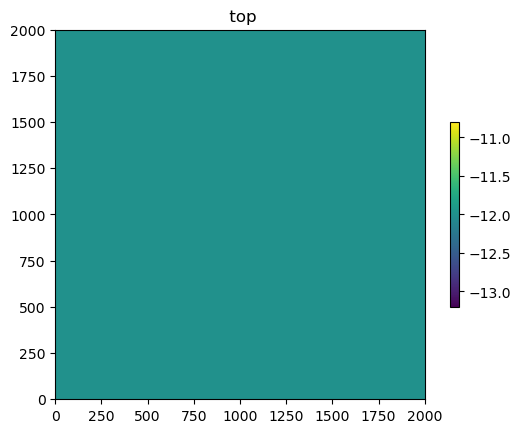

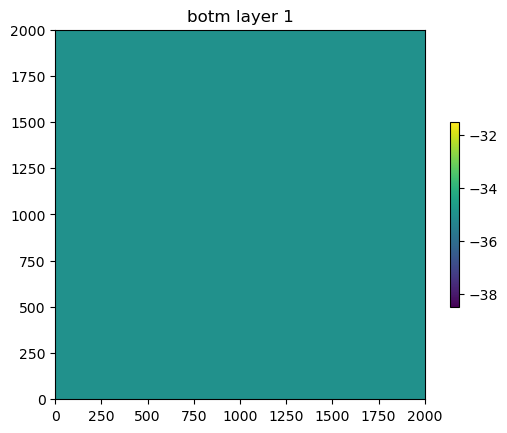

In [14]:
dis.plot()

[<AxesSubplot:title={'center':'strt layer 1'}>]

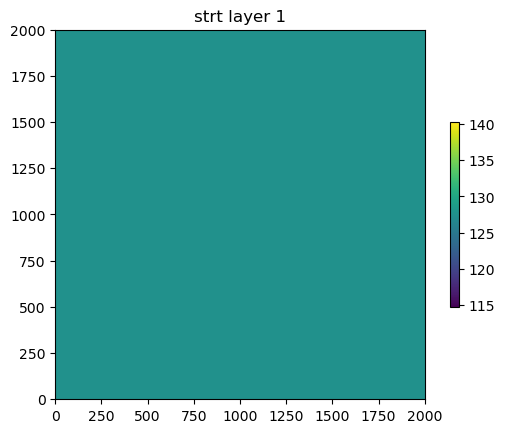

In [15]:
#Initial Conditions
strt = np.ones((nlay, N, N), dtype=np.float32)
strt[:, :, :] = Initial_Head
ic = fp.mf6.ModflowGwfic(gwf, pname="ic", strt=strt)
ic.plot()

In [16]:
# Define positions for the 2 wells
wel_row2 = 29
wel_col2 = 7
wel_row3 = 27
wel_col3 = 20

    # well distance should be >300m from each other 300/50 = 6 cells
distance_2_3 = math.sqrt(((wel_row2 - wel_row3)**2) + ((wel_col2 - wel_col3)**2))
distance_2_1 = math.sqrt(((wel_row2 - wel_row1)**2) + ((wel_col2 - wel_col1)**2))
distance_1_3 = math.sqrt(((wel_row1 - wel_row3)**2) + ((wel_col1 - wel_col3)**2))


if distance_2_3 > 6 and distance_2_1 > 6 and distance_1_3 > 6:
    print("Well 2: row " + str(wel_row2) + " col " + str(wel_col2))
    print("Well 3: row " + str(wel_row3) + " col " + str(wel_col3))   
else:
    print("konta")

Well 2: row 29 col 7
Well 3: row 27 col 20


[<AxesSubplot:title={'center':' wel location stress period 1 layer 1'}>]

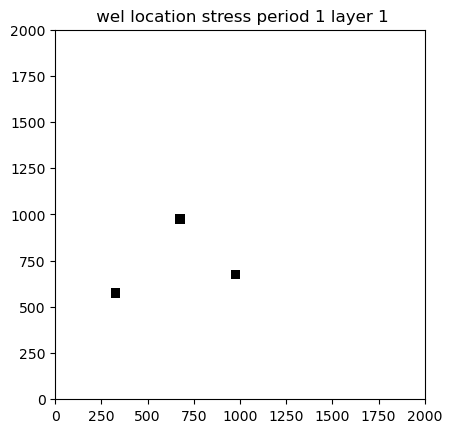

In [17]:
#Well inflows
Q2 = -566
Q3 = -444

#1st stress period
wel_1_0 = [0, wel_row1 - 1, wel_col1 - 1, Q1]
wel_2_0 = [0, wel_row2 - 1, wel_col2 - 1, 0]
wel_3_0 = [0, wel_row3 - 1, wel_col3 - 1, 0]
wel_list_0 = [wel_1_0, wel_2_0, wel_3_0]

#2nd stress period
wel_1 = [0, wel_row1 - 1, wel_col1 - 1, Q1]
wel_2 = [0, wel_row2 - 1, wel_col2 - 1, Q2]
wel_3 = [0, wel_row3 - 1, wel_col3 - 1, Q3]
wel_list = [wel_1, wel_2, wel_3]
wel_sp_data = {0: wel_list_0, 1: wel_list}

#WEL package
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=wel_sp_data, pname="wel")
wel.plot()

[<AxesSubplot:title={'center':'icelltype layer 1'}>,
 <AxesSubplot:title={'center':'k layer 1'}>,
 <AxesSubplot:title={'center':'k22 layer 1'}>,
 <AxesSubplot:title={'center':'k33 layer 1'}>]

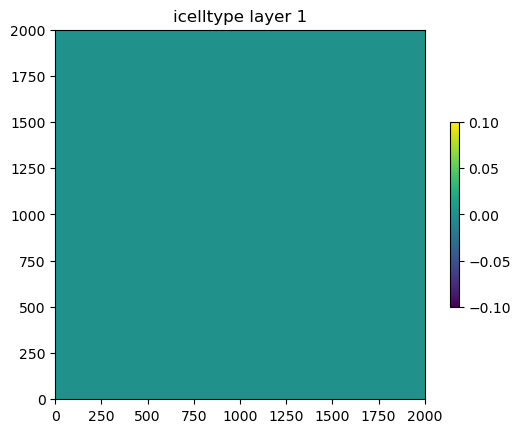

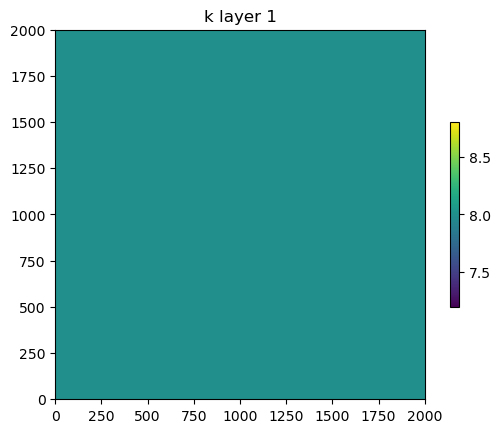

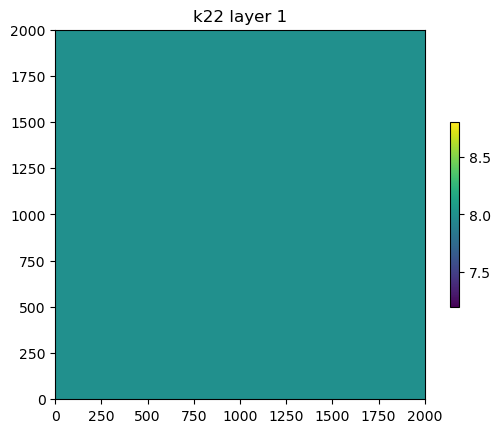

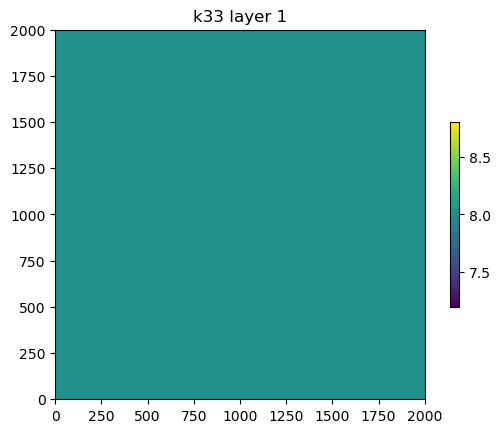

In [18]:
#Node property package 
npf = fp.mf6.ModflowGwfnpf(gwf, save_flows=True, thickstrt=True , cvoptions="DEWATERED",
                                  xt3doptions=False, save_specific_discharge=True, icelltype=0,
                                  k=k, k22=k, k33=k)         #icelltype = confined 0
npf.plot()

[<AxesSubplot:title={'center':' chd location stress period 1 layer 1'}>]

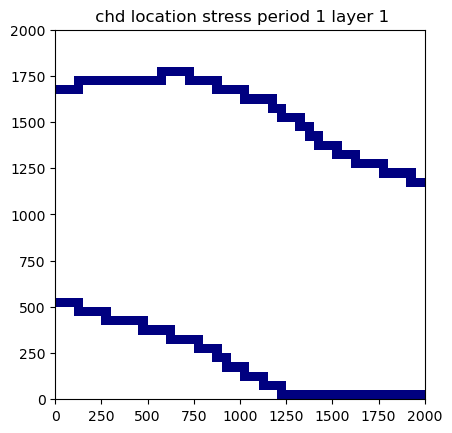

In [19]:
#Constant head (CHD) package
chd_spd = []
for i in range(0,len(H_a_row)):
    chd_spd.append(((0,H_a_row[i]-1,H_a_col[i]-1),H_a))
for i in range(0,len(H_b_row)):
    chd_spd.append(((0,H_b_row[i]-1,H_b_col[i]-1),H_b))

chd = fp.mf6.ModflowGwfchd(gwf, pname="chd", save_flows=True, stress_period_data=chd_spd)
chd.plot()

In [20]:
#Output Control (OC) Package
headfile = "{}.hds".format(gwf.name)
# print(headfile)
head_filerecord = [headfile]
budgetfile = "{}.cbb".format(gwf.name)
budget_filerecord = [budgetfile]
saverecord = [("HEAD", "ALL"), ("BUDGET", "ALL")]
# saverecord = [("HEAD", "LAST"), ("BUDGET", "LAST")]
printrecord = [("HEAD", "LAST")]
oc = fp.mf6.ModflowGwfoc(gwf, saverecord=saverecord, head_filerecord=head_filerecord,
                                budget_filerecord=budget_filerecord, printrecord=printrecord)


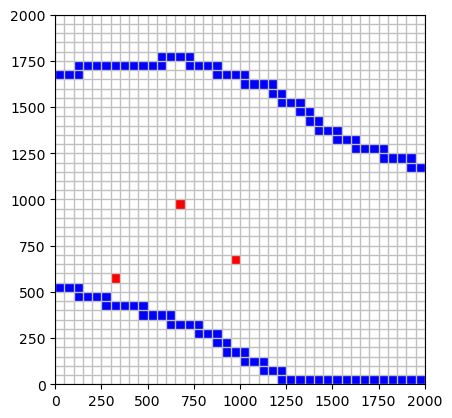

In [21]:
pmv = fp.plot.PlotMapView(model=gwf)
pmv.plot_bc('CHD', color = 'b')
pmv.plot_bc('WEL', plotAll=True, color = 'r')
pmv.plot_grid(colors='silver', lw=1);

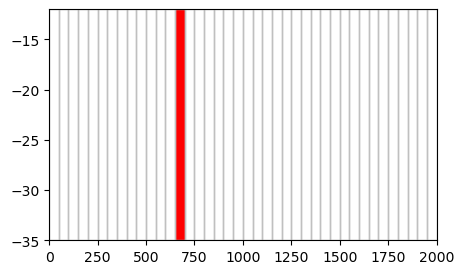

In [22]:
plt.figure(figsize = (5,3))
pxs = fp.plot.PlotCrossSection(model = gwf, line = {"Row": 20})
pxs.plot_bc('CHD')
pxs.plot_bc('WEL')
pxs.plot_grid(colors = 'silver', lw = 1);

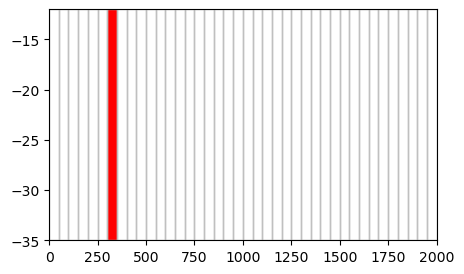

In [23]:
plt.figure(figsize = (5,3))
pxs = fp.plot.PlotCrossSection(model = gwf, line = {"Row": (wel_row2-1)})
pxs.plot_bc('CHD')
pxs.plot_bc('WEL')
pxs.plot_grid(colors = 'silver', lw = 1);


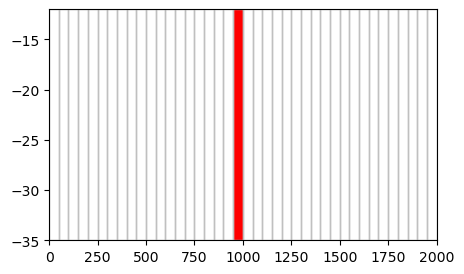

In [24]:
plt.figure(figsize = (5,3))
pxs = fp.plot.PlotCrossSection(model = gwf, line = {"Row": (wel_row3-1)})
pxs.plot_bc('CHD')
pxs.plot_bc('WEL')
pxs.plot_grid(colors = 'silver', lw = 1);

In [25]:
#Groundwater Transport (GWT) Data

In [26]:
gwtname = 'gwt' + modelname
gwt = fp.mf6.ModflowGwt(sim, modelname = gwtname, model_nam_file="{}.nam".format(gwtname))

In [27]:
#IMS GWT
nouter, ninner = 700, 300   
hclose, rclose, relax = 1e-8, 1e-6, 0.97
imsgwt = fp.mf6.ModflowIms(sim, print_option="ALL", outer_dvclose=hclose, outer_maximum=nouter,
                                  under_relaxation="NONE", inner_maximum=ninner, inner_dvclose=hclose,
                                  rcloserecord=[rclose, "STRICT"], linear_acceleration="BICGSTAB", 
                                  scaling_method="NONE", reordering_method="NONE", relaxation_factor=relax,
                                  filename="{}.ims".format(gwt.name))
sim.register_ims_package(imsgwt, [gwt.name])

In [28]:
#DIS Package for GWT Model
gwt_dis = fp.mf6.ModflowGwtdis(gwt, pname="dis", nlay=nlay, nrow=N, ncol=N, delc=delc, delr=delr,
                                      top=top, botm=botm, length_units='meters')


[<AxesSubplot:title={'center':'strt layer 1'}>]

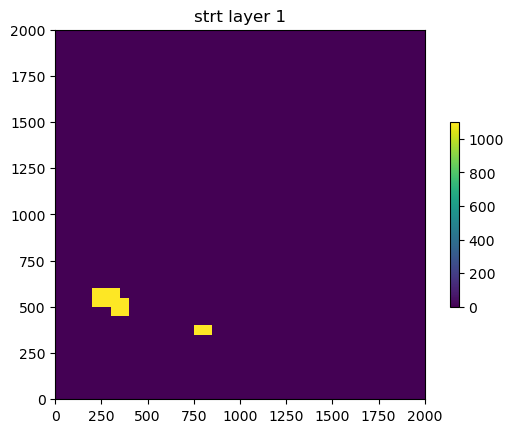

In [29]:
#Initial Concentration (IC) Package
ic_rec = np.zeros((nlay, N, N), dtype=np.float32)  # Concentration Array
for i in range(0,len(S_row)):
    ic_rec[:, S_row[i] - 1, S_col[i] - 1] = S_init_conc
ic = fp.mf6.ModflowGwtic(gwt, strt=ic_rec)
ic.plot()

In [30]:
#Constant Concentration (CNC)
cncspd ={0:[[(0,29, 6), c0],[(0,29, 7), c0],[(0,30, 8), c0],[(0,31, 8), c0],[(0,31,7), c0],[(0,30,7), c0],[(0,30, 6), c0],
            [(0,30,5), c0],[(0,29,5), c0],[(0,33,16), c0],[(0,33, 17), c0]],
            1:[[(0,29, 6), 0],[(0,29, 7), 0],[(0,30, 8), 0],[(0,31, 8), 0],[(0,31,7), 0],[(0,30,7), 0],[(0,30, 6),0],[(0,30,5), 0],
            [(0,29,5), 0],[(0,33,16), 0],[(0,33, 17), 0]]} 
fp.mf6.ModflowGwtcnc(gwt,stress_period_data=cncspd)

package_name = cnc
filename = gwtThesistest1.cnc
package_type = cnc
model_or_simulation_package = model
model_name = gwtThesistest1

Block period
--------------------
stress_period_data
{internal}
(rec.array([((0, 29, 6), 0.), ((0, 29, 7), 0.), ((0, 30, 8), 0.),
           ((0, 31, 8), 0.), ((0, 31, 7), 0.), ((0, 30, 7), 0.),
           ((0, 30, 6), 0.), ((0, 30, 5), 0.), ((0, 29, 5), 0.),
           ((0, 33, 16), 0.), ((0, 33, 17), 0.)],
          dtype=[('cellid', 'O'), ('conc', '<f8')]))



In [31]:
#Advection Package'
adv = fp.mf6.ModflowGwtadv(gwt, scheme = "UPSTREAM")

In [32]:
#Dispersion Package
dsp = fp.mf6.ModflowGwtdsp(gwt, xt3d_off=True, diffc=diffc, alh=alh, ath1=ath1, alv=alv)

In [33]:
#Mass Storage (MST) Package'
mst = fp.mf6.ModflowGwtmst(gwt, porosity=porosity) #can add reactive transport

In [34]:
#Source & Sink Mixing (SSM) Package'
ssm = fp.mf6.ModflowGwtssm(gwt)

In [35]:
#Observation Package'
obs_data = {"{}.obs.csv".format(modelname):
               [("Well 1", "CONCENTRATION", (0, wel_row1 - 1, wel_col1 - 1)),
                ("Well 2", "CONCENTRATION", (0, wel_row2 - 1, wel_col2 - 1)),
               ("Well 3", "CONCENTRATION", (0, wel_row3 - 1, wel_col3 - 1))]}  
obs_package = fp.mf6.ModflowUtlobs(gwt, digits=10, print_input=True, continuous=obs_data)

In [36]:
#OC Package for GWT Model'
concfile = "{}.ucn".format(gwtname)
conc_filerecord = [concfile]
conc_budgetfile = "{}.cbc".format(gwtname)
conc_saverecord = conc_printrecord = [("CONCENTRATION", "ALL"), ("BUDGET", "LAST")]
gwt_oc = fp.mf6.ModflowGwtoc(gwt,
                                concentrationprintrecord=[
                                        ("COLUMNS", 10, "WIDTH", 15, "DIGITS", 6, "GENERAL")],
                                    budget_filerecord=conc_budgetfile,
                                    concentration_filerecord=conc_filerecord,
                                    saverecord=conc_saverecord, printrecord=conc_printrecord)
    
gwf_gwt = fp.mf6.ModflowGwfgwt(sim, exgtype="GWF6-GWT6", exgmnamea=gwf.name, exgmnameb=gwtname)

In [37]:
#Writing and Running the Simulation'
sim.write_simulation(silent = True)
success, buff = sim.run_simulation(silent = True)               # Adding simulation to variables
if not success:                                                 # If simulation doesn't run successfully
    raise Exception("MODFLOW 6 did not terminate normally.")    # Show error
    
sim.run_simulation();

FloPy is using the following executable to run the model: C:\Anaconda3\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                        VERSION 6.4.1 Release 12/09/2022

   MODFLOW 6 compiled Dec 09 2022 18:18:37 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to further analysis and review. No warranty, expressed or 
implied, is made by the USGS or the U.S. Government as to the 
functionality of the software and related material nor shall the 
fact of release constitute any such warranty. Furthermore, the 
software is released on condition that neither the USGS nor the U.S. 
Governmen

In [38]:
Xmod=[wel_col1,wel_col2,wel_col3]
Ymod=[wel_row1,wel_row2,wel_row3]

#Saving Hydraulic Head Drawdowns
heads = sim.simulation_data.mfdata[gwf.name, 'HDS', 'HEAD']
head_grid = np.array(heads[nstp1+nstp2-1][0][:][:]) #2=step
dd = np.zeros(n_ex_wel+n_ad_wel, dtype = float)
for i in range(0,n_ex_wel+n_ad_wel):
    dd[i] = np.array(Initial_Head-head_grid[Ymod[i]-1][Xmod[i]-1]) #BEWARE!!! in Modflow first rows THEN cols!!

In [39]:
#Read binary head file
hds_file = os.path.join(modelws, modelname + '.hds')
headobj = bf.HeadFile(hds_file)
head_data = headobj.get_alldata()

# Calculate heads tables for nstp1 and nstp2 with new Q values
heads_table_nstp1 = np.array(heads[nstp1-1][0][:][:])
heads_table_nstp2 = np.array(heads[nstp2-1][0][:][:])
diafora_heads = abs(heads_table_nstp1 - heads_table_nstp2)

#Reshape the arrays if needed
heads_table_nstp1 = heads_table_nstp1.reshape(40,40)
heads_table_nstp2 = heads_table_nstp2.reshape(40,40)
diafora_heads = diafora_heads.reshape(40,40)

# Print diafora_heads table
print("diafora_heads table:")
for row in diafora_heads:
    print(row)

print(Q2,Q3)
print("Max diafora: " + str(diafora_heads.max()))
print("Min diafora: " + str(diafora_heads.min()))

diafora_heads table:
[4.26325641e-14 0.00000000e+00 1.42108547e-14 1.42108547e-14
 0.00000000e+00 1.42108547e-14 1.42108547e-14 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.42108547e-14 1.42108547e-14 2.84217094e-14 1.42108547e-14
 0.00000000e+00 1.42108547e-14 0.00000000e+00 1.42108547e-14
 4.26325641e-14 5.68434189e-14 7.10542736e-14 8.52651283e-14
 9.94759830e-14 1.70530257e-13 1.84741111e-13 1.70530257e-13
 1.56319402e-13 1.70530257e-13 1.84741111e-13 1.84741111e-13]
[1.42108547e-14 1.42108547e-14 2.84217094e-14 1.42108547e-14
 1.42108547e-14 2.84217094e-14 1.42108547e-14 2.84217094e-14
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.42108547e-14 1.42108547e-14 1.42108547e-14
 0.00000000e+00 0.00000000e+00 2.84217094e-14 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 1.42108547e-14
 0

In [40]:
#Calculate the heads in the model
fname = os.path.join(modelws, f'{modelname}.hds')  #file with extension .hds
hdobj = fp.utils.HeadFile(fname)
head = hdobj.get_data(mflay = 0)
print('minimum head in model: ' , head.min())
print('maximum head in model: ' , head.max())

minimum head in model:  122.99999999999997
maximum head in model:  132.0000000000002


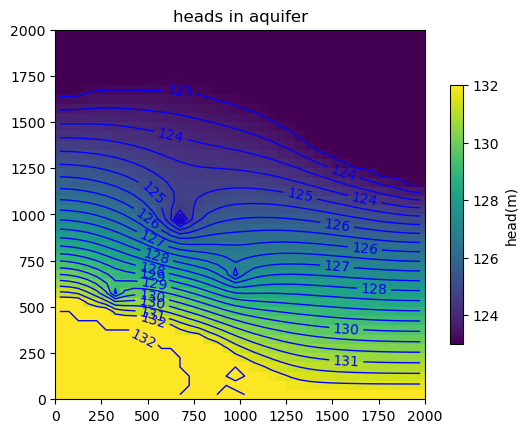

In [41]:
#Plot heads in model
pmv = fp.plot.PlotMapView(model = gwt)
qm = pmv.plot_array(head) #color plot of heads
plt.colorbar(qm, shrink = 0.7, label = 'head(m)')
cs = pmv.contour_array(head, levels = 25, linewidths = 1, colors = 'b') #contour plot of head
plt.clabel(cs, fmt = '%1.0f')
plt.title('heads in aquifer');

In [42]:
#Importing Concentration Data
concfile = 'Results/gwtThesistest1.ucn'
ucnobj = fp.utils.HeadFile(concfile, precision="double", text="CONCENTRATION")
concs = ucnobj.get_alldata()
times = ucnobj.get_times()

In [43]:
#Saving Concentration Grid Data (.txt)'
for step in range(0, nstp1 + nstp2):
        conc = np.array(concs[step, 0], dtype='float32')

In [44]:
#Drawing options
Print_conc_maps = False
PNG_time_step1 = 1  # Time step for images in days (1st period), (User defined) 666
PNG_time_step2 = 1  # Time step for images in days (2nd period), (User defined) 666

In [45]:
if Print_conc_maps == True:
    # region Saving Concentration Images
    os.mkdir(path='Concentration Images')
    os.chdir(path='Concentration Images')
    conc_layer0 = concs[1]
    gridlevels = np.linspace(0, 1000, 10)
palette = plt.cm.plasma 

In [46]:
# Converting object locations from cell number(s) to units of length
wel1x = (wel_col1 - 0.5) * delc
wel1y = L - (wel_row1 - 0.5) * delr
wel2y = L - (wel_row2 - 0.5) * delr
wel2x = (wel_col2 - 0.5) * delc
wel3y = L - (wel_row3 - 0.5) * delr
wel3x = (wel_col3 - 0.5) * delc
Sy = L - (S_row[0] - 0.5) * delr
Sx = (S_col[0] - 0.5) * delc

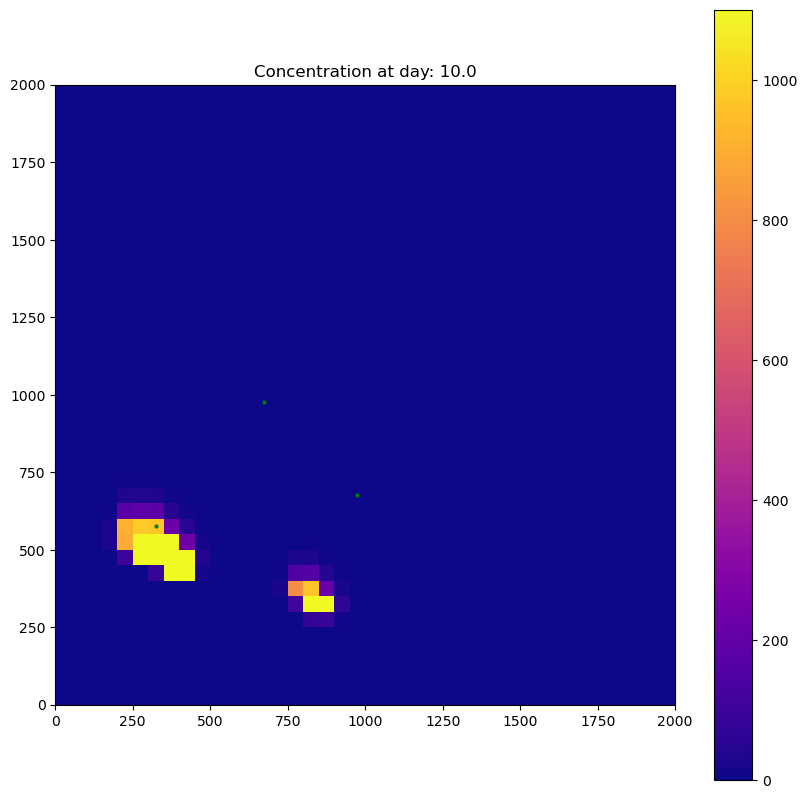

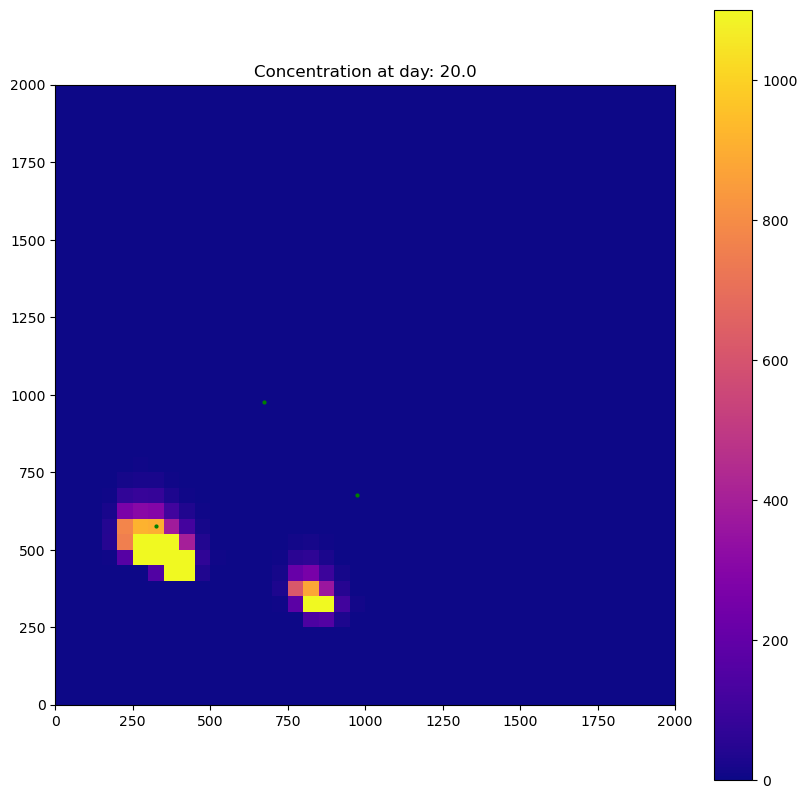

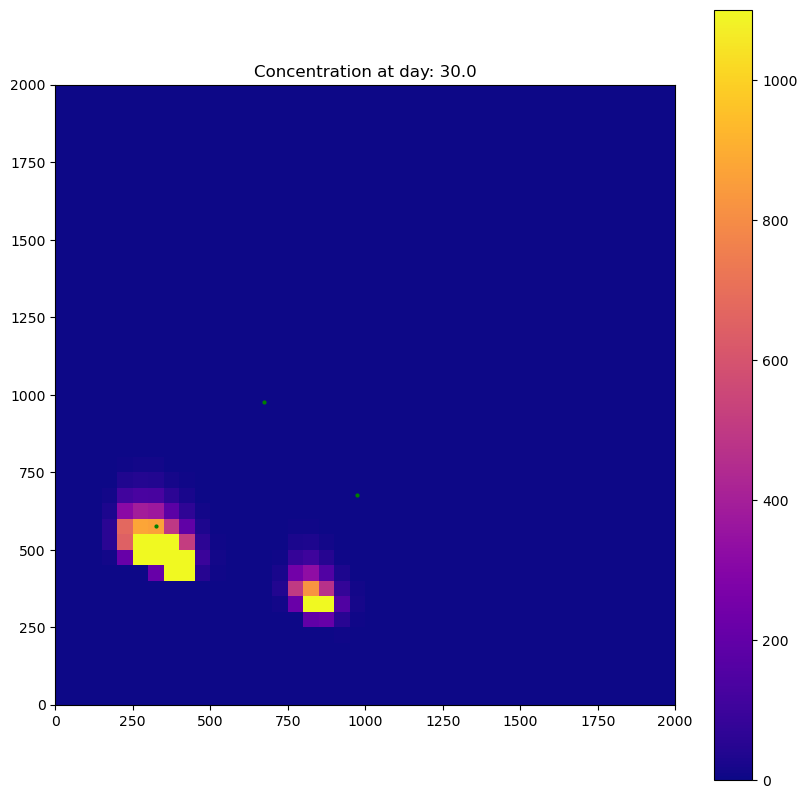

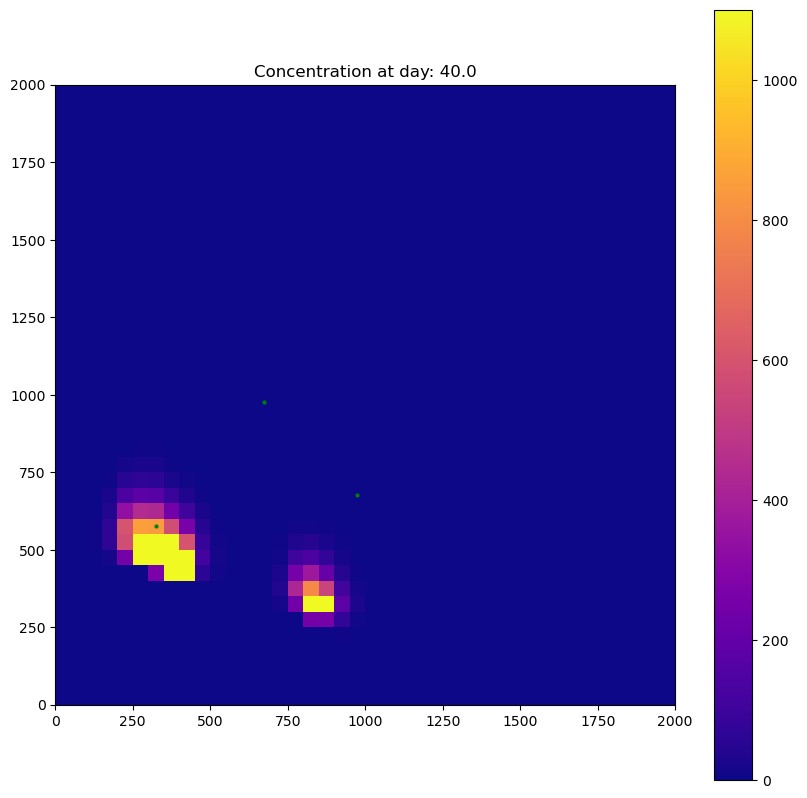

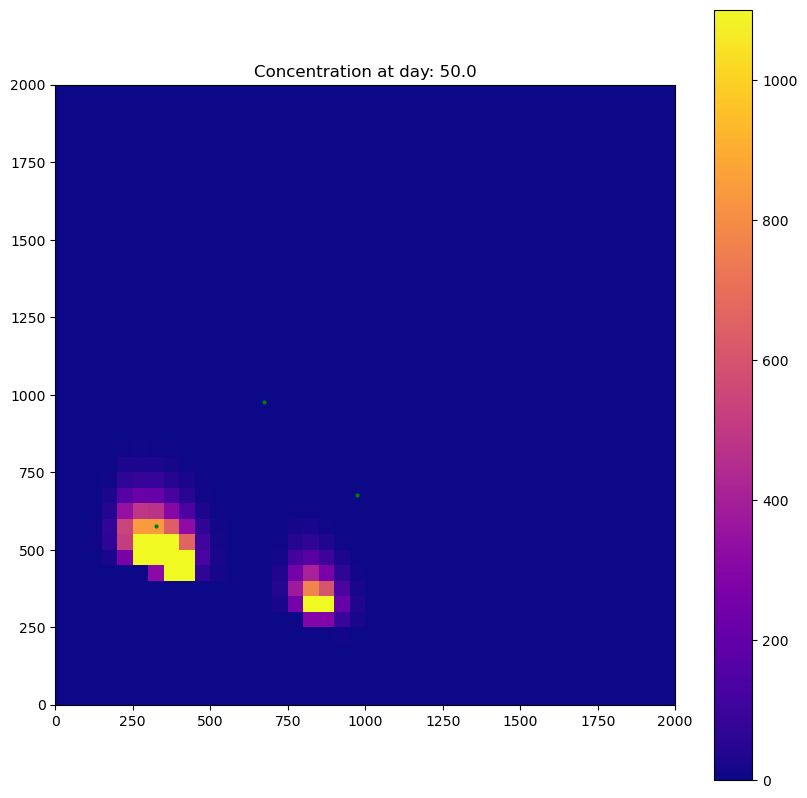

...

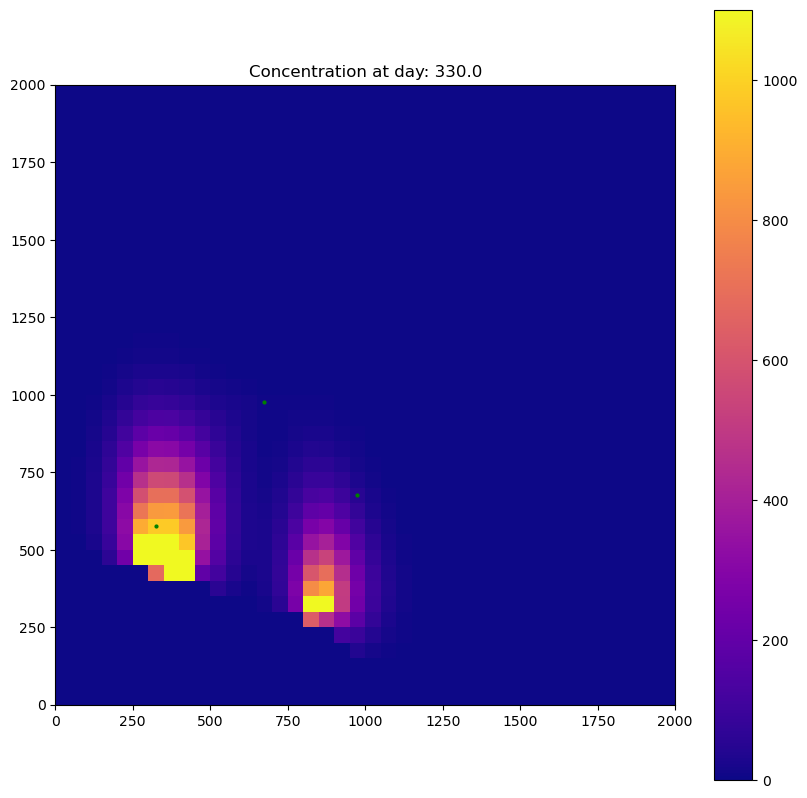

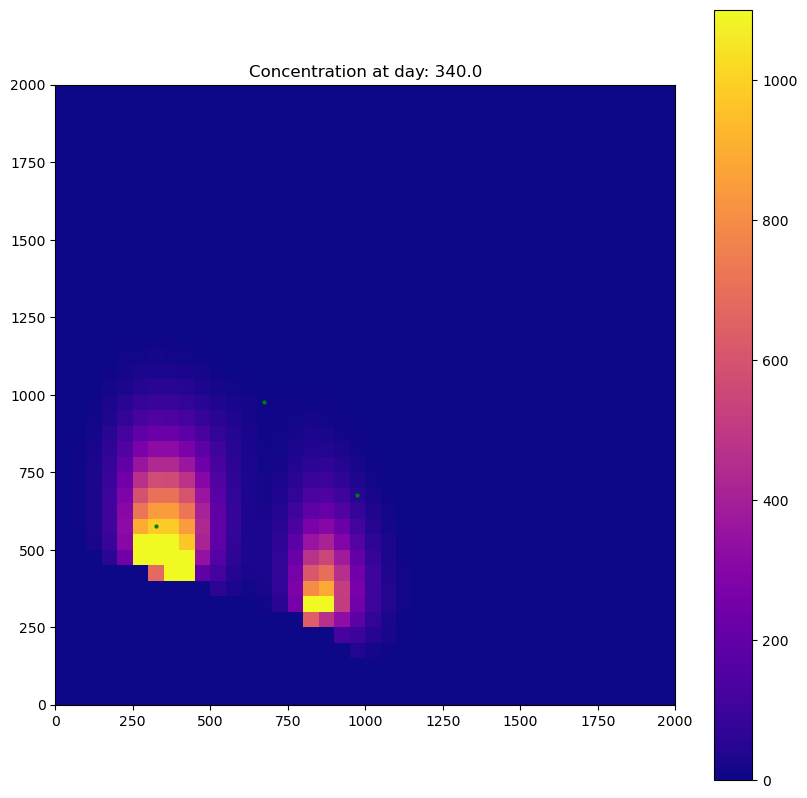

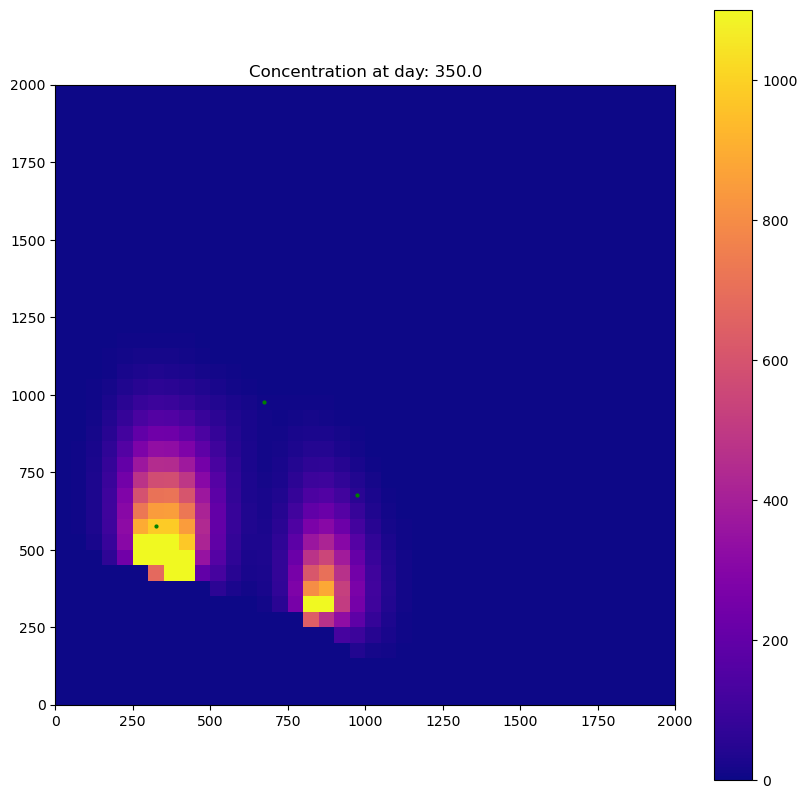

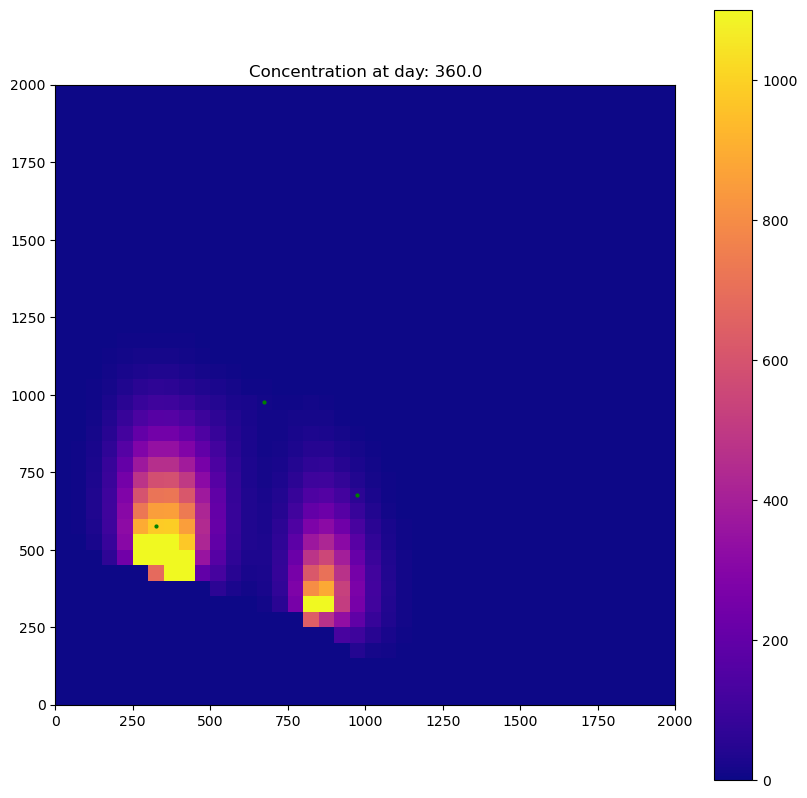

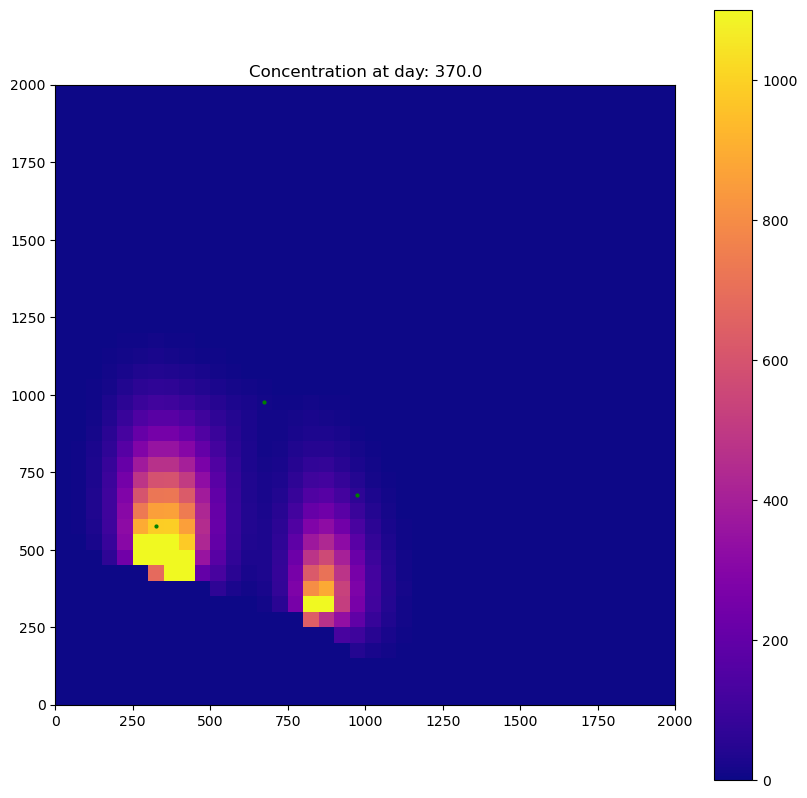

In [47]:
#Concentration plots
for timestep in range(0, nstp1, PNG_time_step1):
        cp_time = times[timestep]
        cp_conc = ucnobj.get_data(totim=cp_time)
        fig = plt.figure(figsize=(10, 10), frameon=False, facecolor='none')
        modelmap = fp.plot.PlotMapView(model=gwt, layer=0)
        cs = modelmap.plot_array(cp_conc, cmap=palette)  # head contour
        plt.plot(wel1x, wel1y, 'go', markersize=2)
        plt.plot(wel2x, wel2y, 'go', markersize=2)
        plt.plot(wel3x, wel3y, 'go', markersize=2)
        #plt.plot(Sx, Sy, 'ro', markersize=5)
        plt.colorbar(cs)  # colorbar
        plt.title("Concentration at day: {}".format(cp_time))
        fig.savefig(fname="{}.png".format(cp_time, dpi=1000, transparent=True))

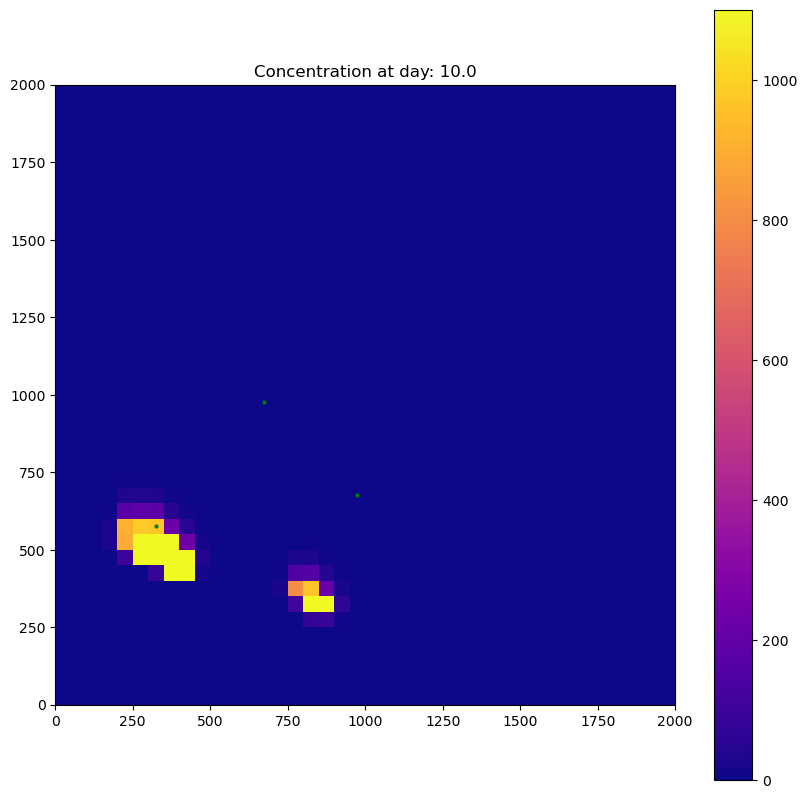

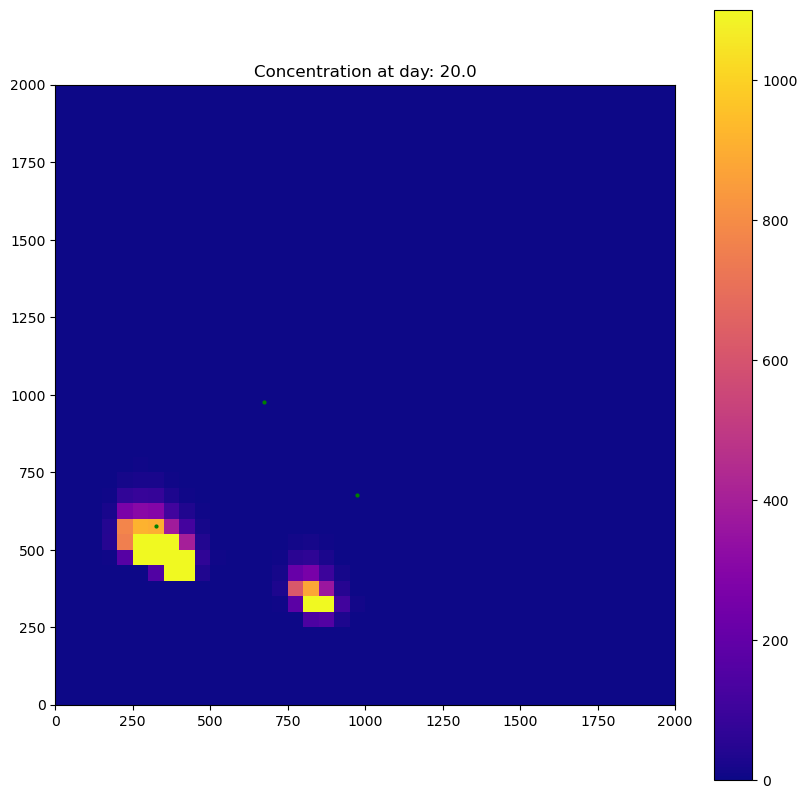

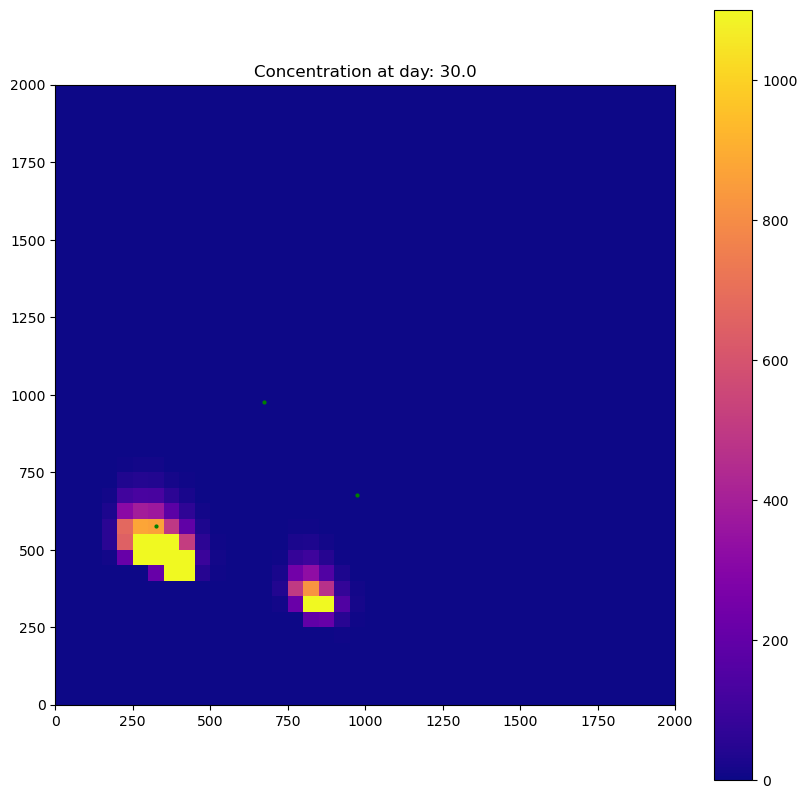

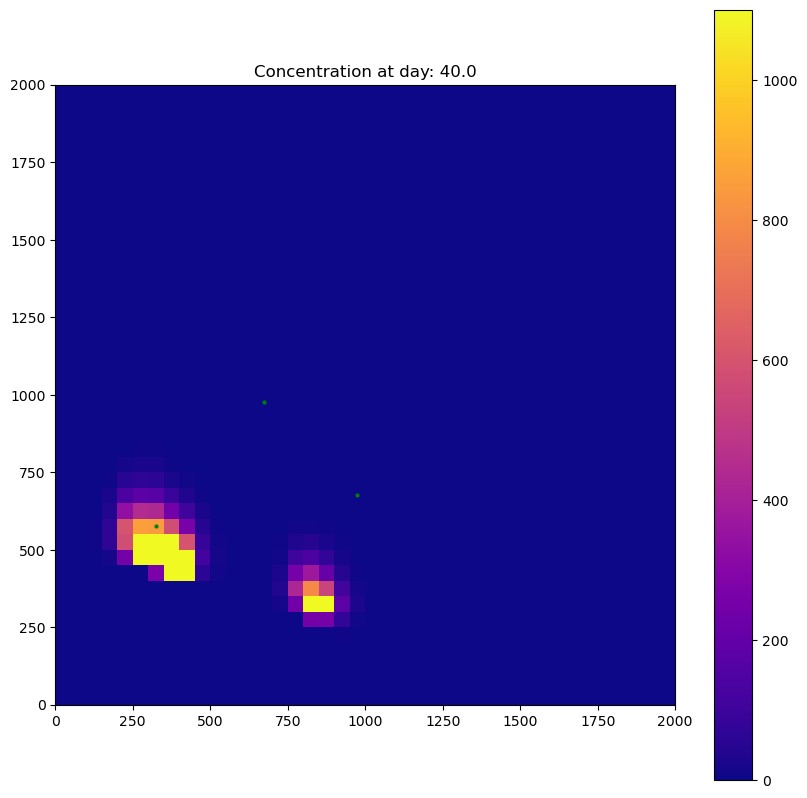

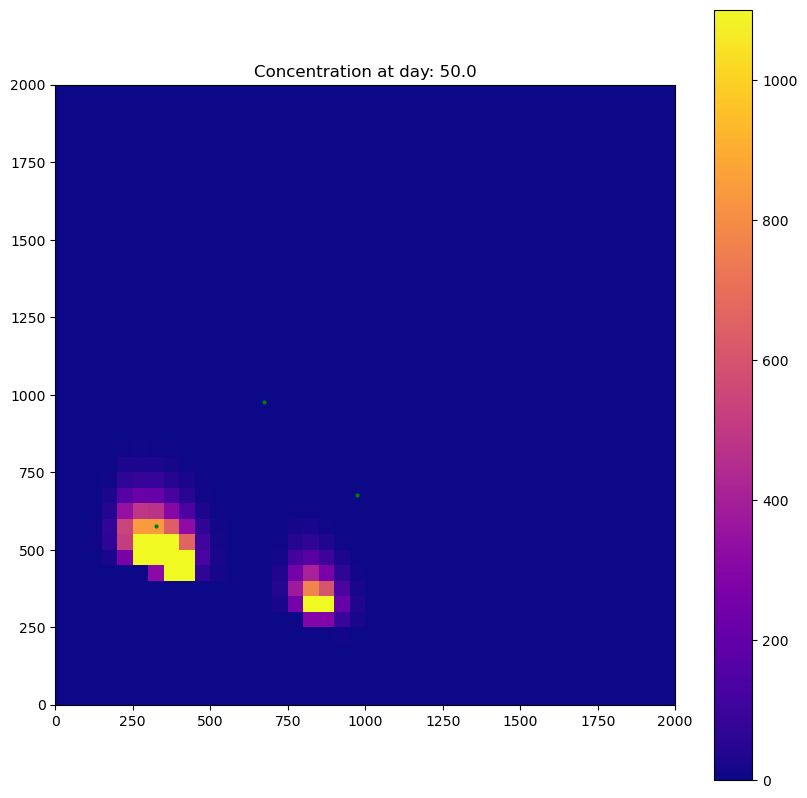

...

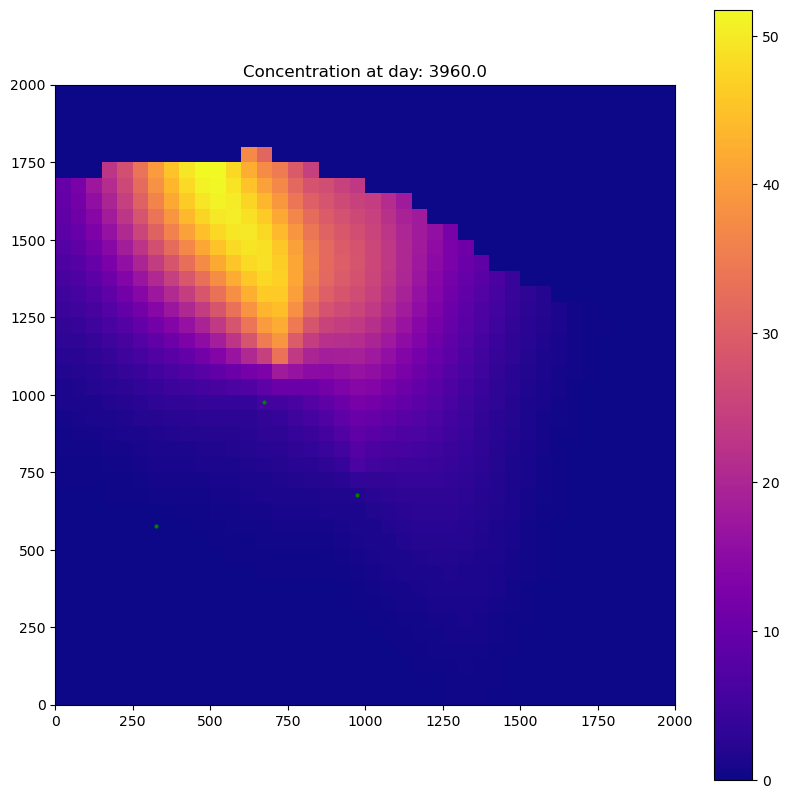

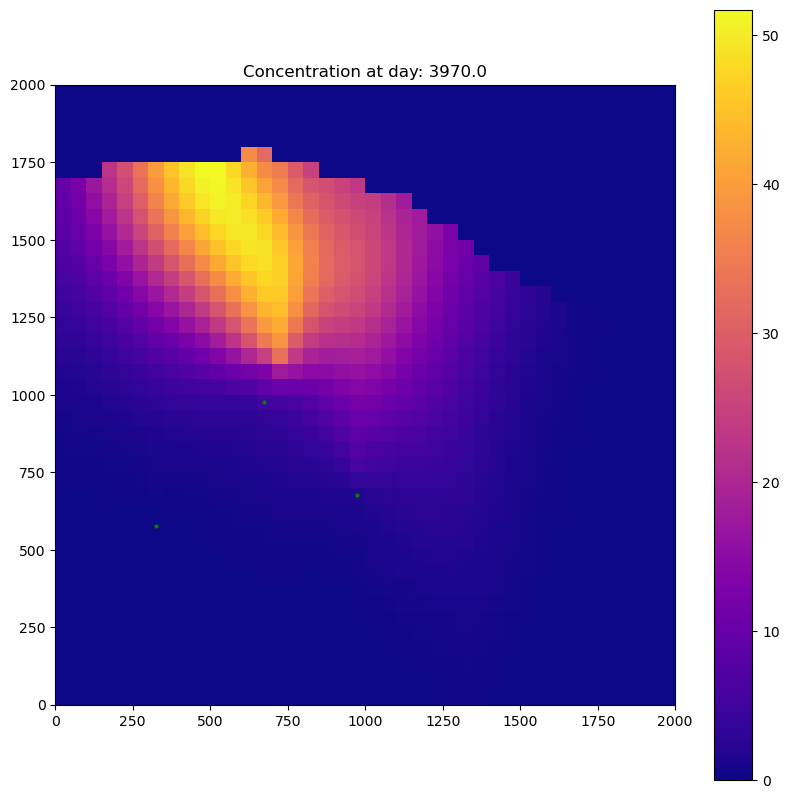

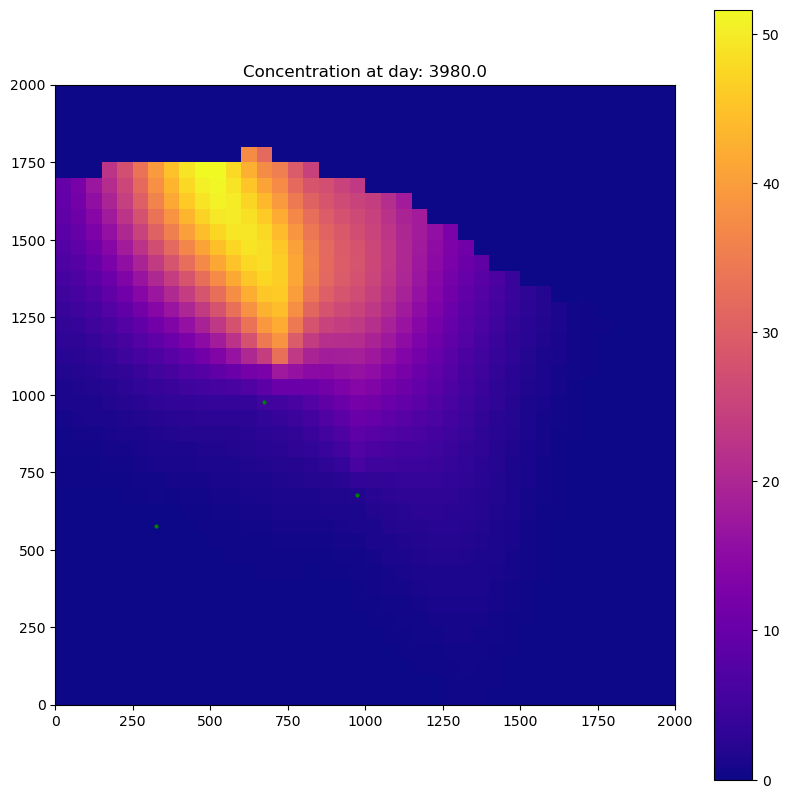

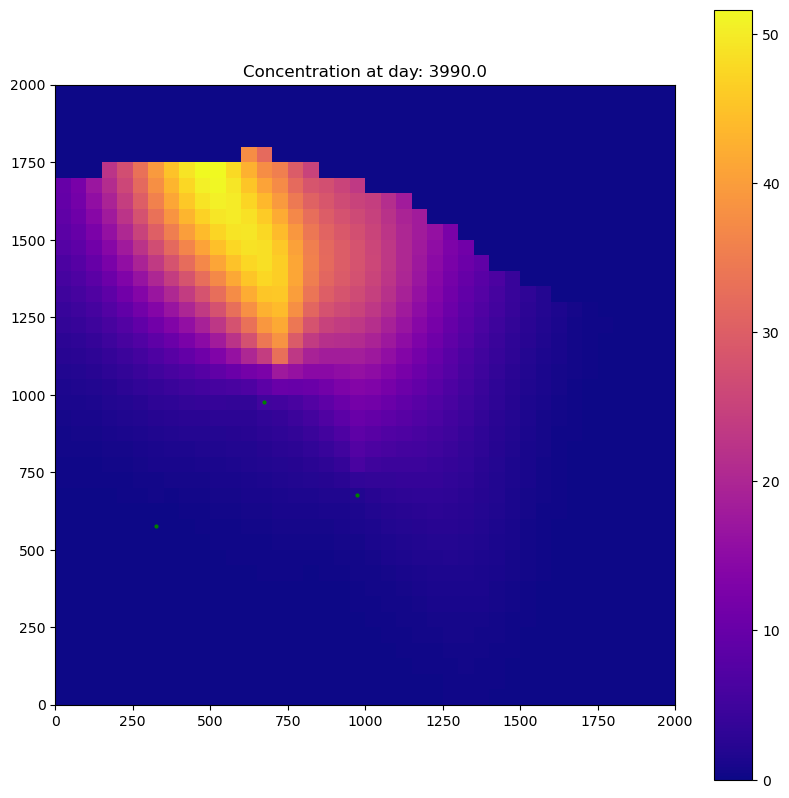

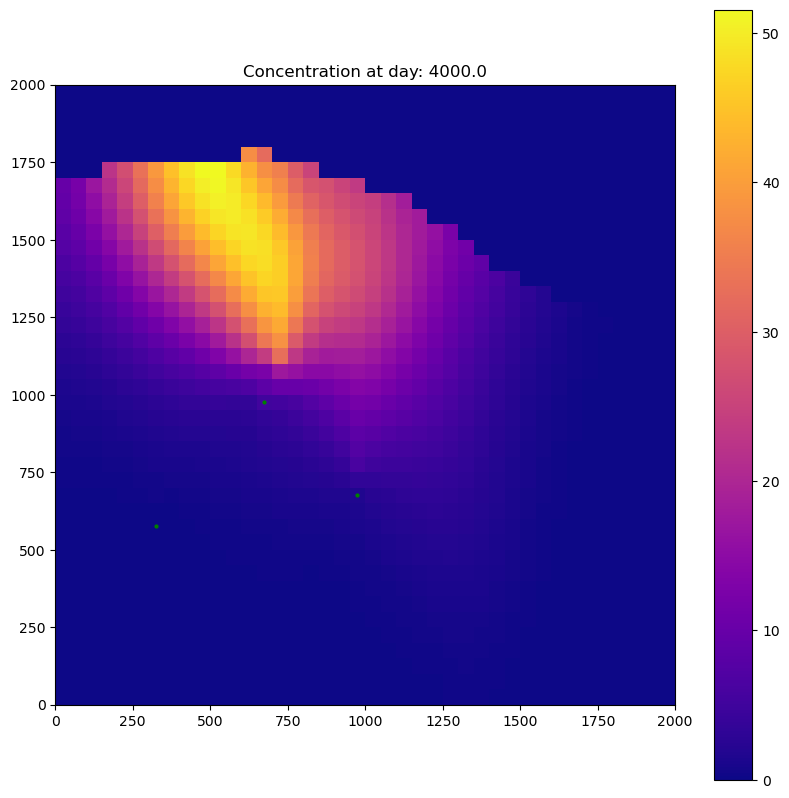

In [48]:
for timestep in range(0, nstp2, PNG_time_step2):
        cp_time = times[timestep]
        cp_conc = ucnobj.get_data(totim=cp_time)
        fig = plt.figure(figsize=(10, 10), frameon=False, facecolor='none')
        modelmap = fp.plot.PlotMapView(model=gwt, layer=0)
        cs = modelmap.plot_array(cp_conc, cmap=palette)  # head contour
        plt.plot(wel1x, wel1y, 'go', markersize=2)
        plt.plot(wel2x, wel2y, 'go', markersize=2)
        plt.plot(wel3x, wel3y, 'go', markersize=2)
        #plt.plot(Sx, Sy, 'ro', markersize=5)
        plt.colorbar(cs)  # colorbar
        #plt.title("Concentration at day: {}".format(int(cp_time / 86400)))
        plt.title("Concentration at day: {}".format(cp_time))
        #fig.savefig(fname="{}.png".format(int(cp_time / 86400), dpi=1000, transparent=True))
        fig.savefig(fname="{}.png".format(cp_time, dpi=1000, transparent=True))